In [70]:
library(tidyverse)
library(cowplot)
library(scales)
library(GGally)
library(ggplot2)

Warning message:
“package ‘GGally’ was built under R version 4.3.2”
Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



In [71]:
url <- "https://raw.githubusercontent.com/werehappy/DSCI-Group-Project-26-/main/data/abalone.data?token=GHSAT0AAAAAACMWOZIHUWO6UOVI7KO6MIFAZPH6NHQ"
download.file(url, "data/abalone_data.csv")
abalone_data <- read_delim("data/abalone_data.csv", delim = ",")
colnames(abalone_data) <- c("Sex", "Length", "Diameter", 
                      "Height", "Whole_weight", "Shucked_weight", "Visera_weight", "Shell_weight", "Rings")
abalone_data

Rows: 4176 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): M
dbl (8): 0.455, 0.365, 0.095, 0.514, 0.2245, 0.101, 0.15, 15

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Visera_weight,Shell_weight,Rings
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7
I,0.425,0.300,0.095,0.3515,0.1410,0.0775,0.120,8
F,0.530,0.415,0.150,0.7775,0.2370,0.1415,0.330,20
F,0.545,0.425,0.125,0.7680,0.2940,0.1495,0.260,16
M,0.475,0.370,0.125,0.5095,0.2165,0.1125,0.165,9
F,0.550,0.440,0.150,0.8945,0.3145,0.1510,0.320,19


In [72]:
abalone_filtered_fct <- abalone_data |> mutate(Sex = as_factor(Sex)) |> 
mutate(Sex = fct_recode(Sex, "Male" = "M", "Female" = "F", "Infant" = "I")) |> select(Sex:Whole_weight)
abalone_filtered_fct

Sex,Length,Diameter,Height,Whole_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.350,0.265,0.090,0.2255
Female,0.530,0.420,0.135,0.6770
Male,0.440,0.365,0.125,0.5160
Infant,0.330,0.255,0.080,0.2050
Infant,0.425,0.300,0.095,0.3515
Female,0.530,0.415,0.150,0.7775
Female,0.545,0.425,0.125,0.7680
Male,0.475,0.370,0.125,0.5095
Female,0.550,0.440,0.150,0.8945


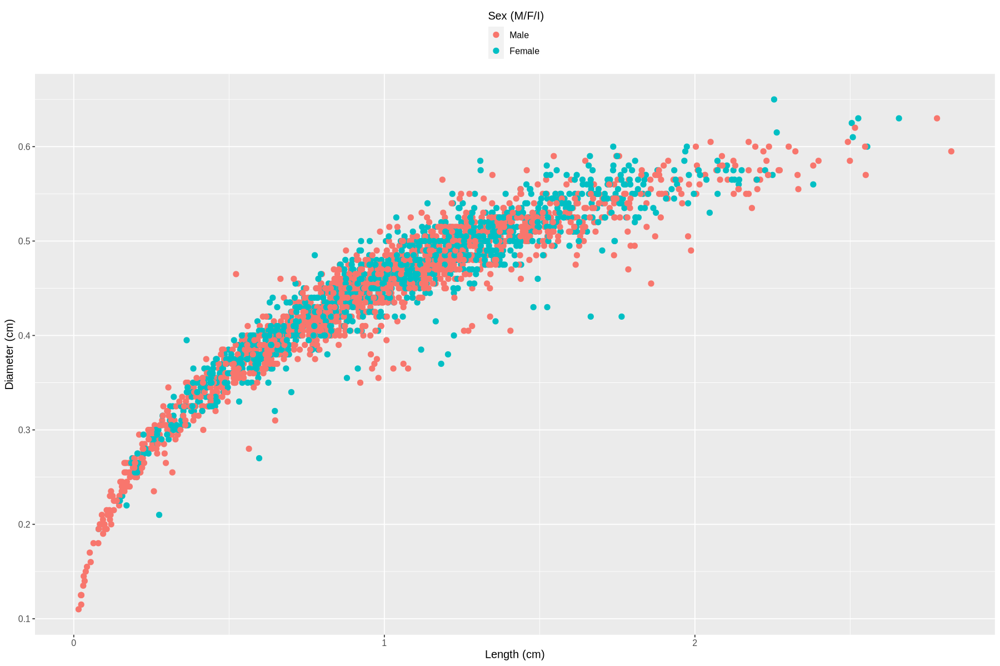

In [73]:
options(repr.plot.width = 15, repr.plot.height = 10)

abalone_no_infant <- abalone_filtered_fct |> filter(Sex != "Infant")

abalone_no_infant |>
    ggplot(aes(x = Whole_weight, 
               y = Diameter, 
               colour = Sex)) +
        labs(x = "Length (cm)",
             y = "Diameter (cm)",
            colour = 'Sex (M/F/I)') +
        geom_point(size = 2.5) +
        theme(text = element_text(size = 12),
        legend.position = "top",
        legend.direction = "vertical")

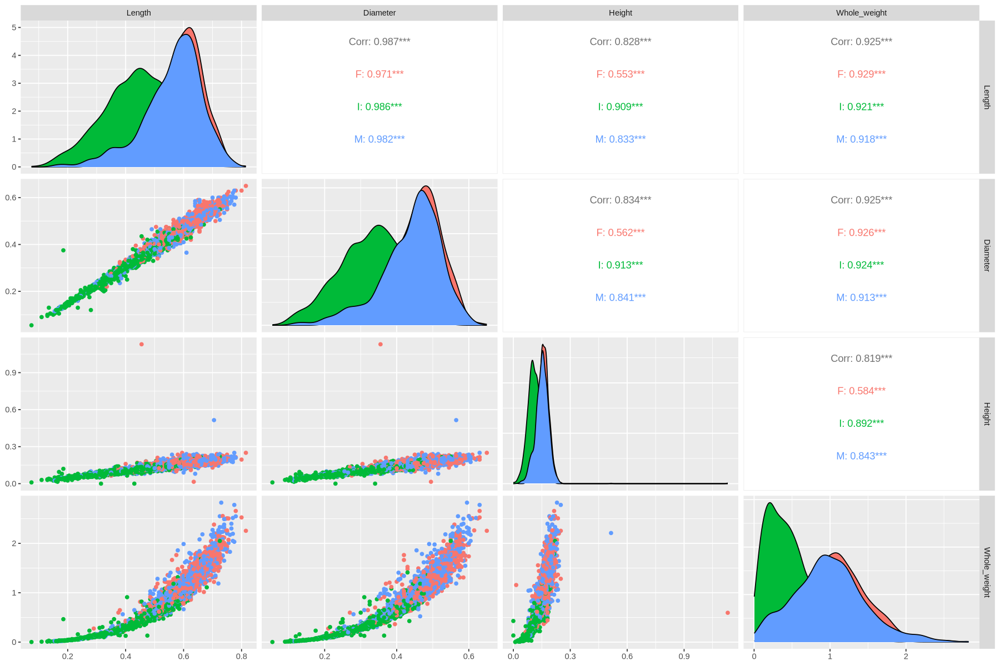

In [80]:
ggpairs(abalone_data, columns = 2:5, ggplot2::aes(colour = Sex))